**Pipeline For Surgical Ergonomics Measurements**

Note: files can be run locally as well; however, scripts should be run in the
same directories as in this Colab demo, replacing parts of absolute paths when
appropriate.

In [1]:
# install necessary packages
!pip install open3d
!pip install trimesh
!pip install pyvista
!pip install pyglet==1.5.11
!pip install rtree
!pip install pymeshfix

You should consider upgrading via the '/Users/primary/Documents/GitHub/cs-thesis/3d-ergonomics/.venv/bin/python3.10 -m pip install --upgrade pip' command.
You should consider upgrading via the '/Users/primary/Documents/GitHub/cs-thesis/3d-ergonomics/.venv/bin/python3.10 -m pip install --upgrade pip' command.
You should consider upgrading via the '/Users/primary/Documents/GitHub/cs-thesis/3d-ergonomics/.venv/bin/python3.10 -m pip install --upgrade pip' command.
You should consider upgrading via the '/Users/primary/Documents/GitHub/cs-thesis/3d-ergonomics/.venv/bin/python3.10 -m pip install --upgrade pip' command.
You should consider upgrading via the '/Users/primary/Documents/GitHub/cs-thesis/3d-ergonomics/.venv/bin/python3.10 -m pip install --upgrade pip' command.
You should consider upgrading via the '/Users/primary/Documents/GitHub/cs-thesis/3d-ergonomics/.venv/bin/python3.10 -m pip install --upgrade pip' command.


In [1]:
import os
os.environ["PYTORCH_ENABLE_MPS_FALLBACK"] = "1"
import sys
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
# import open3d as o3d
# import trimesh
# from trimesh.curvature import discrete_gaussian_curvature_measure, discrete_mean_curvature_measure, sphere_ball_intersection
# import pyvista as pv
# import pymeshfix

Data Extraction

Data Synchronization

In [3]:
# find all trials with at least 2 timestamped views
!python3 tools/find_timestamped_trials.py --data_folder /Users/primary/Documents/GitHub/cs-thesis/3d-ergonomics/data/data-3d
!cat tools/timestamped_trials.txt

SB1C
3 timestamped views
['/Users/primary/Documents/GitHub/cs-thesis/3d-ergonomics/data/data-3d/SB/SB1Cleft/image.txt', '/Users/primary/Documents/GitHub/cs-thesis/3d-ergonomics/data/data-3d/SB/SB1Cright/image.txt', '/Users/primary/Documents/GitHub/cs-thesis/3d-ergonomics/data/data-3d/SB/SB1Cback/image.txt']



In [4]:
# SB1C and SB1R have 3 timestamped views
!python3 tools/synchronize.py --operation_name SB --data_dir /Users/primary/Documents/GitHub/cs-thesis/3d-ergonomics/data/data-3d --truth_cam_info /Users/primary/Documents/GitHub/cs-thesis/3d-ergonomics/data/data-3d/SB/SB1Cback/image.txt --other_cam_info /Users/primary/Documents/GitHub/cs-thesis/3d-ergonomics/data/data-3d/SB/SB1Cleft/image.txt --third_cam_info /Users/primary/Documents/GitHub/cs-thesis/3d-ergonomics/data/data-3d/SB/SB1Cright/image.txt
!head -5 tools/posenet_frames.txt

/Users/primary/Documents/GitHub/cs-thesis/3d-ergonomics/data/data-3d/SB/SB1Cback/data/image/0000000197-1681416328262.2876.png,/Users/primary/Documents/GitHub/cs-thesis/3d-ergonomics/data/data-3d/SB/SB1Cleft/data/image/0000000178-1681416328238.343.png,/Users/primary/Documents/GitHub/cs-thesis/3d-ergonomics/data/data-3d/SB/SB1Cright/data/image/0000000006-1681416328242.86.png
/Users/primary/Documents/GitHub/cs-thesis/3d-ergonomics/data/data-3d/SB/SB1Cback/data/image/0000000433-1681416357603.1306.png,/Users/primary/Documents/GitHub/cs-thesis/3d-ergonomics/data/data-3d/SB/SB1Cleft/data/image/0000000287-1681416357578.2869.png,/Users/primary/Documents/GitHub/cs-thesis/3d-ergonomics/data/data-3d/SB/SB1Cright/data/image/0000000134-1681416357582.8245.png
/Users/primary/Documents/GitHub/cs-thesis/3d-ergonomics/data/data-3d/SB/SB1Cback/data/image/0000000474-1681416362737.7837.png,/Users/primary/Documents/GitHub/cs-thesis/3d-ergonomics/data/data-3d/SB/SB1Cleft/data/image/0000000306-1681416362713.20

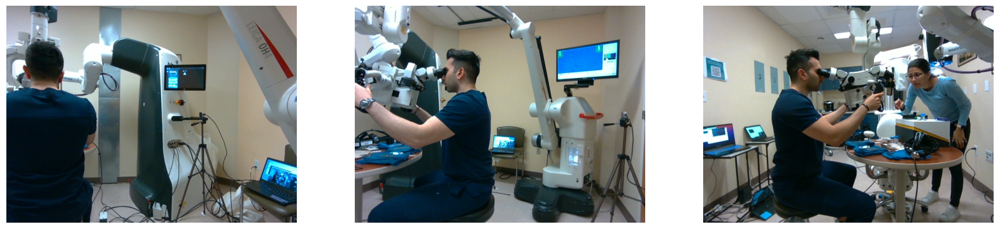

In [5]:
# display second line of images and use it thereafter
fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot(1, 3, 1)
ax.imshow(Image.open('data/data-3d/SB/SB1Cback/data/image/0000000433-1681416357603.1306.png').convert('RGB'))
plt.box(False)
plt.axis('off')
ax = fig.add_subplot(1, 3, 2)
ax.imshow(Image.open('data/data-3d/SB/SB1Cleft/data/image/0000000287-1681416357578.2869.png').convert('RGB'))
plt.box(False)
plt.axis('off')
ax = fig.add_subplot(1, 3, 3)
ax.imshow(Image.open('data/data-3d/SB/SB1Cright/data/image/0000000134-1681416357582.8245.png').convert('RGB'))
plt.box(False)
plt.axis('off')
plt.show()

Camera Extrinsic Matrix Calculation

In [6]:
# classical computer vision methods - to visualize, must run locally

!python3 tools/calculate_extrinsics.py \
--colab_environment True \
--back_intrinsics_path /Users/primary/Documents/GitHub/cs-thesis/3d-ergonomics/data/data-3d/SB/SB1Cback/data/intrinsics.npy \
--left_intrinsics_path /Users/primary/Documents/GitHub/cs-thesis/3d-ergonomics/data/data-3d/SB/SB1Cleft/data/intrinsics.npy \
--right_intrinsics_path /Users/primary/Documents/GitHub/cs-thesis/3d-ergonomics/data/data-3d/SB/SB1Cright/data/intrinsics.npy \
--back_image_path /Users/primary/Documents/GitHub/cs-thesis/3d-ergonomics/data/data-3d/SB/SB1Cback/data/image/0000000433-1681416357603.1306.png \
--left_image_path /Users/primary/Documents/GitHub/cs-thesis/3d-ergonomics/data/data-3d/SB/SB1Cleft/data/image/0000000287-1681416357578.2869.png \
--right_image_path /Users/primary/Documents/GitHub/cs-thesis/3d-ergonomics/data/data-3d/SB/SB1Cright/data/image/0000000134-1681416357582.8245.png

Local Registration: Source to Target Transformation:  [[ 0.70571706 -0.64354768  0.2963272  -0.20468774]
 [ 0.69294085  0.71410857 -0.09940791  0.15829908]
 [-0.14763606  0.27549108  0.94989908 -0.01605251]
 [ 0.          0.          0.          1.        ]]
Local Registration: Source_2 to Target Transformation:  [[ 0.91126294 -0.40358771 -0.0819562   0.04713703]
 [ 0.25306578  0.7057695  -0.66170017  0.48427904]
 [ 0.32489624  0.58224254  0.74527583 -0.09070714]
 [ 0.          0.          0.          1.        ]]
Global Registration: Source to Target Transformation: [[-0.37086065 -0.92755983  0.04577269  0.01776202]
 [-0.12760617  0.09971603  0.98679956 -0.98582645]
 [-0.91987991  0.36012425 -0.15534311  1.43992355]
 [ 0.          0.          0.          1.        ]]
Global Registration: Source_2 to Target Transformation: [[-0.74392698 -0.53685684 -0.39794143  0.1968607 ]
 [ 0.59235738 -0.80540643 -0.02081382 -0.11174984]
 [-0.30933055 -0.2512075   0.91717468 -0.18897056]
 [ 0.       

In [2]:
# unsupervised learning
os.chdir('model/calibrated-backprojection-network')
!pwd

# if need to setup the data by concatenating aligned images into triplets, set flag
SETUP_DATA_FLAG = True

/Users/primary/Documents/GitHub/cs-thesis/3d-ergonomics/model/calibrated-backprojection-network


In [3]:
!chmod 755 bash/create_dense_depth.sh

!bash bash/create_dense_depth.sh

/Users/primary/Documents/GitHub/cs-thesis/3d-ergonomics/.venv/lib/python3.10/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: 'dlopen(/Users/primary/Documents/GitHub/cs-thesis/3d-ergonomics/.venv/lib/python3.10/site-packages/torchvision/image.so, 0x0006): Symbol not found: __ZN3c1017RegisterOperatorsD1Ev
  Referenced from: <9A4710B9-0DA3-36BB-9129-645F282E64B2> /Users/primary/Documents/GitHub/cs-thesis/3d-ergonomics/.venv/lib/python3.10/site-packages/torchvision/image.so
  Expected in:     <E3D17B4A-4867-3D49-BC92-E04C28EE0F45> /Users/primary/Documents/GitHub/cs-thesis/3d-ergonomics/.venv/lib/python3.10/site-packages/torch/lib/libtorch_cpu.dylib'If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(
xFormers not available
xFormers not avail

In [4]:
if SETUP_DATA_FLAG:

    # move the above posenet_frames.txt to the setup folder, as the model uses
    # but only use one set of aligned image (overfitting doesn't matter)
    # use the second line in posenet_frames.txt
    !sed -n '2p' ../../tools/posenet_frames.txt > setup/posenet_frames.txt

    !python3 setup/setup_dataset_3dergonomics.py

Current directory:  /Users/primary/Documents/GitHub/cs-thesis/3d-ergonomics/model/calibrated-backprojection-network
os path exists
Storing training image file paths into: training/synchronized/train_image.txt
Storing training sparse depth file paths into: training/synchronized/train_depth.txt
Storing training dense depth file paths into: training/synchronized/train_dense_depth.txt
Storing training intrinsics file paths into: training/synchronized/train_intrinsics.txt


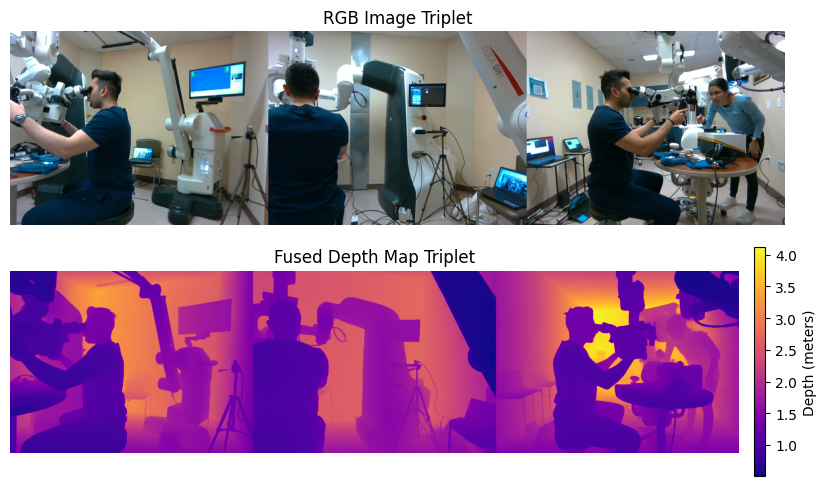

In [8]:
import sys
sys.path.append("/Users/primary/Documents/GitHub/cs-thesis/3d-ergonomics/model/calibrated-backprojection-network/src")

import data_utils
import matplotlib.pyplot as plt

# Paths
rgb_path = "/Users/primary/Documents/GitHub/cs-thesis/3d-ergonomics/data/synchronized_derived/SB/SB1Cback/data/image/0000000433-1681416357603.1306.png"
dense_depth_path =  "/Users/primary/Documents/GitHub/cs-thesis/3d-ergonomics/data/synchronized_derived/SB/SB1Cback/data/dense_depth/0000000433-1681416357603.1306.png"
import sys
sys.path.append("/Users/primary/Documents/GitHub/cs-thesis/3d-ergonomics/model/calibrated-backprojection-network/src")

rgb_image       = plt.imread(rgb_path)  # RGB image
dense_depth_map = data_utils.load_depth(dense_depth_path, data_format='HW')

# Figure with two rows, very small vertical gap
fig, (ax1, ax2) = plt.subplots(
    2, 1,
    figsize=(10, 6),
    gridspec_kw={'hspace': 0.02}
)

# Top: RGB triplet (no cbar)
ax1.imshow(rgb_image)
ax1.set_title('RGB Image Triplet')
ax1.axis('off')

# Bottom: fused depth with cbar
im2 = ax2.imshow(dense_depth_map, cmap='plasma')
ax2.set_title('Fused Depth Map Triplet')
ax2.axis('off')

# Colorbar only on the bottom subplot
cbar = fig.colorbar(
    im2,
    ax=ax2,
    orientation='vertical',
    fraction=0.04,
    pad=0.02
)
cbar.set_label('Depth (meters)')

plt.show()


[[430.915802     0.         313.98199463 429.20822144   0.
  316.68951416 431.10137939   0.         312.63406372]
 [  0.         430.44171143 242.95022583   0.         428.67947388
  245.8825531    0.         430.71676636 240.85664368]
 [  0.           0.           1.           0.           0.
    1.           0.           0.           1.        ]]


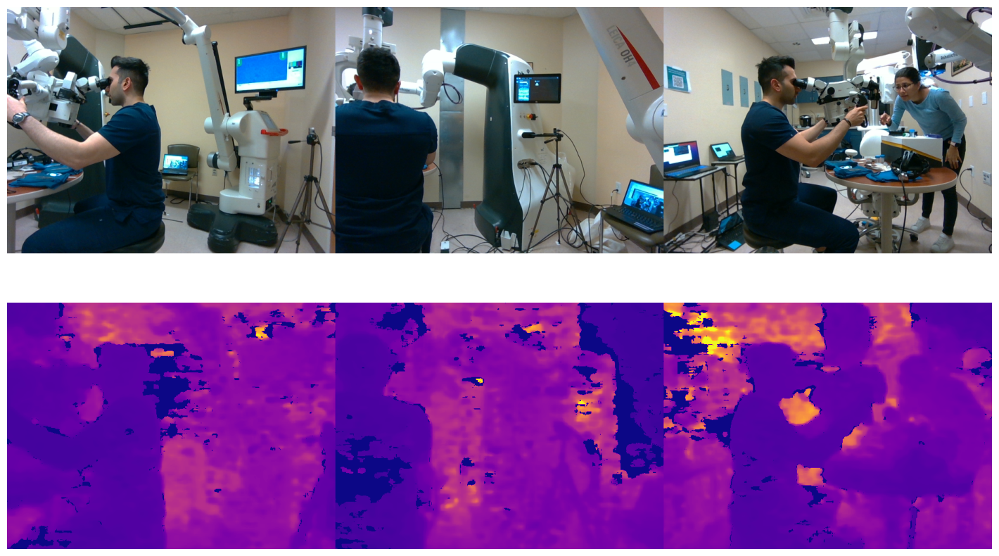

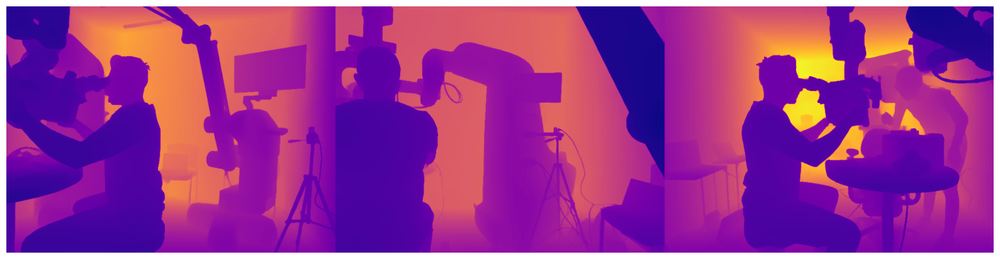

In [27]:
import numpy as np

# visualize outputs
[image_path] = !cat training/synchronized/train_image.txt
[depth_path] = !cat training/synchronized/train_depth.txt
[dense_depth_path] = !cat training/synchronized/train_dense_depth.txt
[intrinsics_path] = !cat training/synchronized/train_intrinsics.txt

print(np.load(intrinsics_path))

fig = plt.figure(figsize=(20, 10))

ax = fig.add_subplot(2, 1, 1)
ax.imshow(Image.open(image_path).convert('RGB'))
plt.box(False)
plt.axis('off')

ax = fig.add_subplot(2, 1, 2)
ax.imshow(np.array(Image.open(depth_path)), cmap='plasma')
plt.box(False)
plt.axis('off')

# ax = fig.add_subplot(3, 1, 3)
# ax.imshow(np.array(Image.open(dense_depth_path)), cmap='plasma')
# plt.box(False)
# plt.axis('off')

plt.show()

# new plot for just the dense depth
fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot(1, 1, 1)
ax.imshow(np.array(Image.open(dense_depth_path)), cmap='plasma')
plt.box(False)
plt.axis('off')
plt.show()

Semantic Segmentation

/Users/primary/Documents/GitHub/cs-thesis/3d-ergonomics/model/calibrated-backprojection-network
# label:color_rgb:parts:actions
back:127,69,31::
background:0,0,0::
neck:247,175,66::
shoulders:45,4,211::


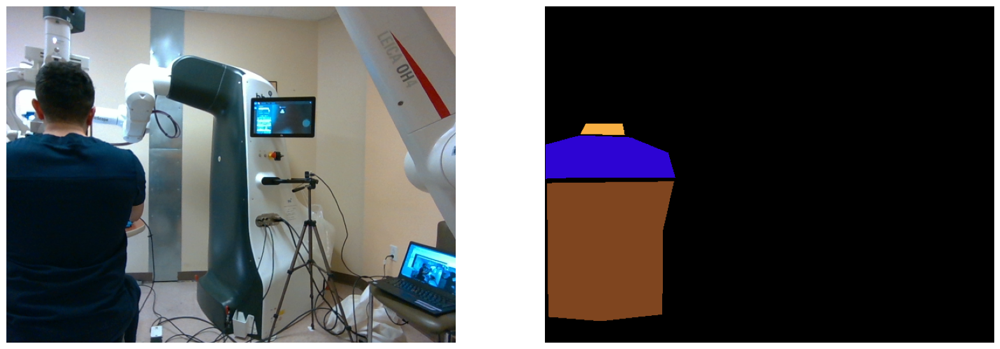

In [ ]:
os.chdir("../..")
# visualize CVAT annotations
# CVAT annotations come from handpicked dataset of 110 images, found in data/scans
# the list of images used in the training dataset given in
# segmentation/subpixel-embedding-segmentation/training/ergonomics/train_scans.txt

# output annotation labels
!cat data/annotated_png/labelmap.txt

fig = plt.figure(figsize=(20, 20))

ax = fig.add_subplot(1, 2, 1)
ax.imshow(Image.open('data/scans/SB/SB1Cback/data/image/0000000474-1681416362737.7837.png'))
plt.box(False)
plt.axis('off')

ax = fig.add_subplot(1, 2, 2)
ax.imshow(Image.open('data/annotated_png/SB/SB1Cback/SegmentationClass/0000000474-1681416362737.7837.png'))
plt.box(False)
plt.axis('off')

plt.show()

In [16]:
os.chdir('segmentation/subpixel-embedding-segmentation')

# if training the segmentation model on the provided dataset, set flag
SEGMENTATION_TRAIN_FLAG = True

# if need to setup the data, set flag
SEGMENTATION_SETUP_FLAG = True

In [15]:
if SEGMENTATION_SETUP_FLAG:
    # convert png to npy, convert the colors of the 3 classes to RGB
    # input.txt gives paths to all training maps to be converted, labels.txt gives the label map as displayed above
    !python3 setup/setup_ergonomics.py --input_file setup/input.txt --labels_file setup/labels.txt

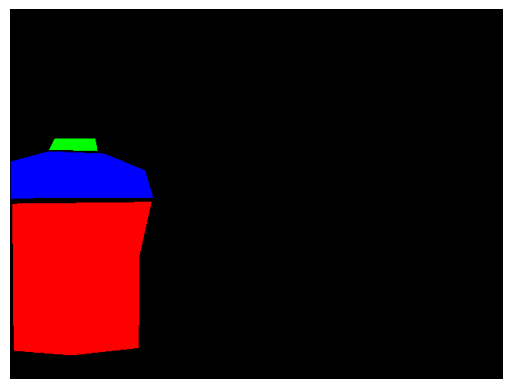

In [19]:
# visualize the result of the setup above
RGB_annotation = np.load('../../data/annotated/SB/SB1Cback/SegmentationClass/0000000474-1681416362737.7837.npy').astype(np.float32)

plt.imshow(RGB_annotation)
plt.box(False)
plt.axis('off')
plt.show()

In [ ]:
# set to True to create augmentations
AUGMENTATION_FLAG = False

if AUGMENTATION_FLAG:
    !chmod 755 bash/segformer/augment.sh
    !bash/segformer/augment.sh

In [ ]:
# train the model
!chmod 755 bash/segformer/train_segformer.sh
!bash/segformer/train_segformer.sh

In [ ]:
# evaluate segformer
!chmod 755 bash/segformer/eval_segformer.sh
!bash/segformer/eval_segformer.sh

# evaluate the unet
!python3 external_src/generic_unet/evaluate_generic_unet.py


U-Net Implementation


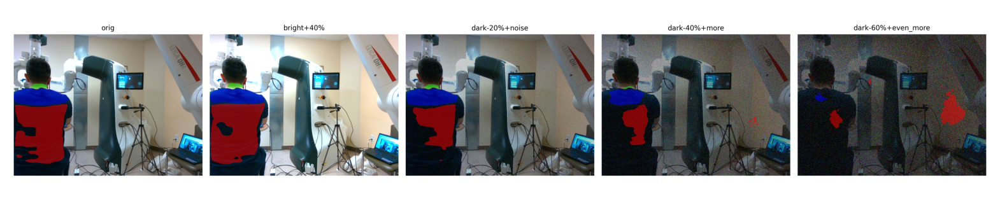

Segformer Implementation


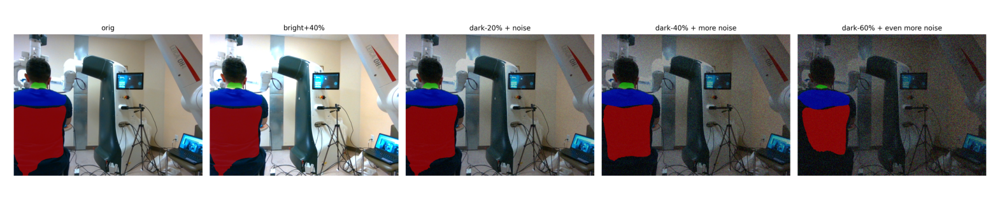

U-Net Implementation


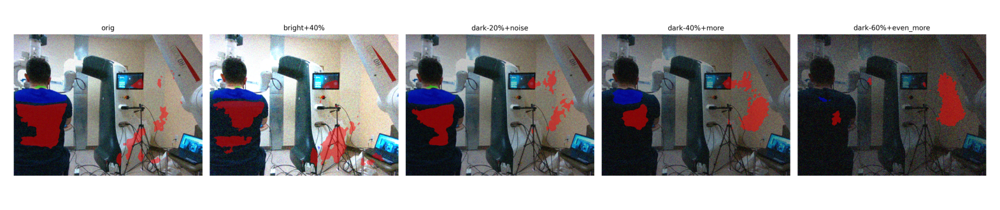

Segformer Implementation


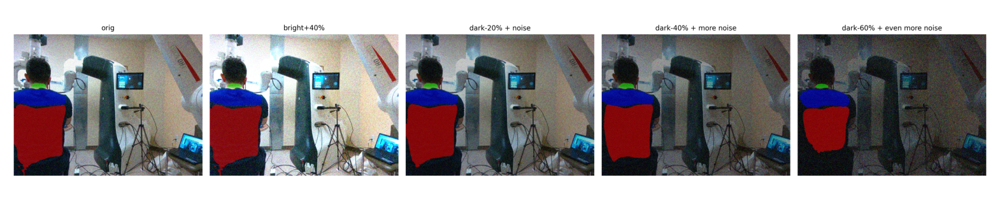

U-Net Implementation


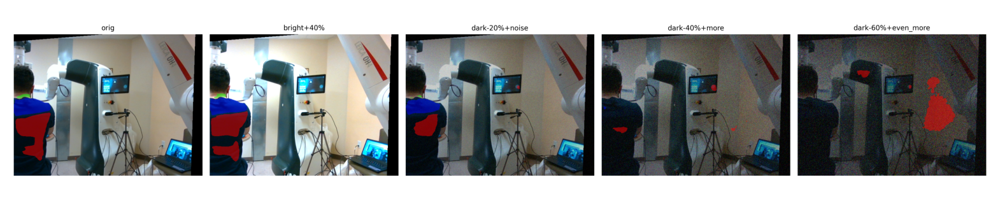

Segformer Implementation


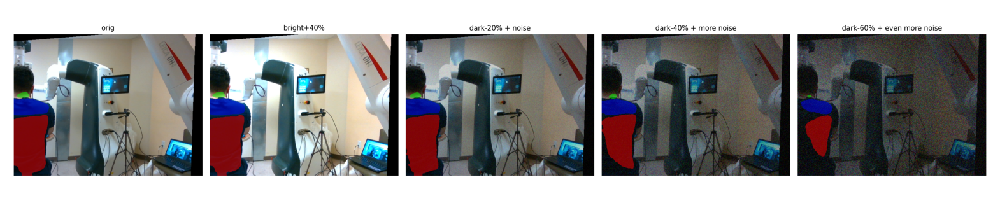

In [21]:
from matplotlib import pyplot as plt
from PIL import Image

images_to_evaluate = [11, 19, 21]

for image in images_to_evaluate:
    print("U-Net Implementation")
    fig = plt.figure(figsize=(20, 20))
    plt.imshow(Image.open(f'evaluation_results/unet_brightness/unet_{image}.png'))
    plt.box(False)
    plt.axis('off')
    plt.show()
    print("Segformer Implementation")
    fig = plt.figure(figsize=(20, 20))
    plt.imshow(Image.open(f'evaluation_results/segformer_brightness/segformer_{image}.png'))
    plt.box(False)
    plt.axis('off')
    plt.show()


In [ ]:
# use the paths given in the original 'testing/ergonomics/test_scans.txt' file within the segmentation model
!cat segmentation/subpixel-embedding-segmentation/testing/ergonomics/test_scans.txt

In [29]:
os.chdir('../..')

In [55]:
# output posture indices; to visualize, must run locally
# line 'i' in the test_scans.txt file corresponds to patient 'i - 1'
# surface 0: shoulders; surface 1: neck; surface 2: back

# compare the postures between robotic and conventional trials with VS3
print("VS3C")
!python3 tools/measure_posture.py \
--image_path segmentation/subpixel-embedding-segmentation/evaluation_results/u-net/unet_traintest/test_scans/scan_color/scan_color_patient5.png \
--depth_path data/scans_testing/VS/VS3Cback/data/depth/0000000543.png \
--intrinsics_path data/scans_testing/VS/VS3Cback/data/intrinsics.npy \
--prediction_map segmentation/subpixel-embedding-segmentation/evaluation_results/u-net/unet_traintest/test_scans/pred_map/pred_map_patient5.png \
--colab_environment True
print()

print("VS3C")
!python3 tools/measure_posture.py \
--image_path segmentation/subpixel-embedding-segmentation/evaluation_results/u-net/unet_traintest/test_scans/scan_color/scan_color_patient5.png \
--depth_path data/scans_testing/VS/VS3Cback/data/dense_depth/0000000543.png \
--intrinsics_path data/scans_testing/VS/VS3Cback/data/intrinsics.npy \
--prediction_map segmentation/subpixel-embedding-segmentation/evaluation_results/segformer/test_scans/pred_map/pred_map_patient5.png \
--colab_environment True
print()

print("VS3R")
!python3 tools/measure_posture.py \
--image_path segmentation/subpixel-embedding-segmentation/evaluation_results/u-net/unet_traintest/test_scans/scan_color/scan_color_patient6.png \
--depth_path data/scans_testing/VS/VS3Rback/data/depth/0000000543.png \
--intrinsics_path data/scans_testing/VS/VS3Rback/data/intrinsics.npy \
--prediction_map segmentation/subpixel-embedding-segmentation/evaluation_results/u-net/unet_traintest/test_scans/pred_map/pred_map_patient6.png \
--colab_environment True

print("VS3R")
!python3 tools/measure_posture.py \
--image_path segmentation/subpixel-embedding-segmentation/evaluation_results/u-net/unet_traintest/test_scans/scan_color/scan_color_patient6.png \
--depth_path data/scans_testing/VS/VS3Rback/data/dense_depth/0000000543.png \
--intrinsics_path data/scans_testing/VS/VS3Rback/data/intrinsics.npy \
--prediction_map segmentation/subpixel-embedding-segmentation/evaluation_results/segformer/test_scans/pred_map/pred_map_patient6.png \
--colab_environment True

VS3C
INFO- Loaded 312 vertices and 547 faces.

100% done 
Average Mean Curvature For Surface 0: 27.780085189372972
INFO- Loaded 79 vertices and 94 faces.

100% done 
Average Mean Curvature For Surface 1: 19.82247728569062
INFO- Loaded 427 vertices and 780 faces.

100% done 
Average Mean Curvature For Surface 2: 19.46535379295578

VS3C
^C


VS3R
INFO- Loaded 148 vertices and 253 faces.

100% done 
Average Mean Curvature For Surface 0: 22.52930206448247
INFO- Loaded 23 vertices and 28 faces.

100% done 
Average Mean Curvature For Surface 1: 10.876503918844538
INFO- Loaded 126 vertices and 201 faces.

100% done 
Average Mean Curvature For Surface 2: 23.879494315815585
VS3R
[Open3D WARNING] GLFW Error: Cocoa: Failed to find service port for display
[Open3D WARNING] GLFW Error: Cocoa: Failed to find service port for display
INFO- Loaded 190 vertices and 335 faces.

100% done 
Average Mean Curvature For Surface 0: 41.25721567168514
INFO- Loaded 32 vertices and 48 faces.

100% done 
Average M

In [56]:
# compare the postures over time and across surgery type using SB1C and SB1R
print("SB1C - frame 3618")
!python3 tools/measure_posture.py \
--image_path segmentation/subpixel-embedding-segmentation/evaluation_results/u-net/unet_traintest/test_scans/scan_color/scan_color_patient1.png \
--depth_path data/scans_testing/SB/SB1Cback/data/depth/0000003618-1681416747736.9832.png \
--intrinsics_path data/scans_testing/SB/SB1Cback/data/intrinsics.npy \
--prediction_map segmentation/subpixel-embedding-segmentation/evaluation_results/u-net/unet_traintest/test_scans/pred_map/pred_map_patient1.png \
--colab_environment True
print()

# compare the postures over time and across surgery type using SB1C and SB1R
print("SB1C - frame 3618")
!python3 tools/measure_posture.py \
--image_path segmentation/subpixel-embedding-segmentation/evaluation_results/u-net/unet_traintest/test_scans/scan_color/scan_color_patient1.png \
--depth_path data/scans_testing/SB/SB1Cback/data/dense_depth/0000003618-1681416747736.9832.png \
--intrinsics_path data/scans_testing/SB/SB1Cback/data/intrinsics.npy \
--prediction_map segmentation/subpixel-embedding-segmentation/evaluation_results/segformer/test_scans/pred_map/pred_map_patient1.png \
--colab_environment True
print()


print("SB1C - frame 32026")
# 1681420278112.6125 - 1681416747736.9832 = 3530375.62939 ms = 58.8 min elapsed
!python3 tools/measure_posture.py \
--image_path segmentation/subpixel-embedding-segmentation/evaluation_results/u-net/unet_traintest/test_scans/scan_color/scan_color_patient2.png \
--depth_path data/scans_testing/SB/SB1Cback/data/depth/0000032026-1681420278112.6125.png \
--intrinsics_path data/scans_testing/SB/SB1Cback/data/intrinsics.npy \
--prediction_map segmentation/subpixel-embedding-segmentation/evaluation_results/u-net/unet_traintest/test_scans/pred_map/pred_map_patient2.png \
--colab_environment True
print()

print("SB1C - frame 32026")
# 1681420278112.6125 - 1681416747736.9832 = 3530375.62939 ms = 58.8 min elapsed
!python3 tools/measure_posture.py \
--image_path segmentation/subpixel-embedding-segmentation/evaluation_results/u-net/unet_traintest/test_scans/scan_color/scan_color_patient2.png \
--depth_path data/scans_testing/SB/SB1Cback/data/dense_depth/0000032026-1681420278112.6125.png \
--intrinsics_path data/scans_testing/SB/SB1Cback/data/intrinsics.npy \
--prediction_map segmentation/subpixel-embedding-segmentation/evaluation_results/segformer/test_scans/pred_map/pred_map_patient2.png \
--colab_environment True
print()

print("SB1R - frame 1050")
!python3 tools/measure_posture.py \
--image_path segmentation/subpixel-embedding-segmentation/evaluation_results/u-net/unet_traintest/test_scans/scan_color/scan_color_patient3.png \
--depth_path data/scans_testing/SB/SB1Rback/data/depth/0000001050-1681413477438.56.png \
--intrinsics_path data/scans_testing/SB/SB1Rback/data/intrinsics.npy \
--prediction_map segmentation/subpixel-embedding-segmentation/evaluation_results/u-net/unet_traintest/test_scans/pred_map/pred_map_patient3.png \
--colab_environment True
print()


print("SB1R - frame 1050")
!python3 tools/measure_posture.py \
--image_path segmentation/subpixel-embedding-segmentation/evaluation_results/u-net/unet_traintest/test_scans/scan_color/scan_color_patient3.png \
--depth_path data/scans_testing/SB/SB1Rback/data/dense_depth/0000001050-1681413477438.56.png \
--intrinsics_path data/scans_testing/SB/SB1Rback/data/intrinsics.npy \
--prediction_map segmentation/subpixel-embedding-segmentation/evaluation_results/segformer/test_scans/pred_map/pred_map_patient3.png \
--colab_environment True
print()

print("SB1R - frame 7064")
# 1681414211362.1973 - 1681413477438.56 = 733923.637207 ms = 12.2 min elapsed
!python3 tools/measure_posture.py \
--image_path segmentation/subpixel-embedding-segmentation/evaluation_results/u-net/unet_traintest/test_scans/scan_color/scan_color_patient4.png \
--depth_path data/scans_testing/SB/SB1Rback/data/depth/0000007064-1681414211362.1973.png \
--intrinsics_path data/scans_testing/SB/SB1Rback/data/intrinsics.npy \
--prediction_map segmentation/subpixel-embedding-segmentation/evaluation_results/u-net/unet_traintest/test_scans/pred_map/pred_map_patient4.png \
--colab_environment True

print("SB1R - frame 7064")
# 1681414211362.1973 - 1681413477438.56 = 733923.637207 ms = 12.2 min elapsed
!python3 tools/measure_posture.py \
--image_path segmentation/subpixel-embedding-segmentation/evaluation_results/u-net/unet_traintest/test_scans/scan_color/scan_color_patient4.png \
--depth_path data/scans_testing/SB/SB1Rback/data/dense_depth/0000007064-1681414211362.1973.png \
--intrinsics_path data/scans_testing/SB/SB1Rback/data/intrinsics.npy \
--prediction_map segmentation/subpixel-embedding-segmentation/evaluation_results/segformer/test_scans/pred_map/pred_map_patient4.png \
--colab_environment True

SB1C - frame 3618
INFO- Loaded 264 vertices and 445 faces.

100% done 
Average Mean Curvature For Surface 0: 9.190993946400903
INFO- Loaded 25 vertices and 31 faces.

100% done 
Average Mean Curvature For Surface 1: 2.013877431487787
INFO- Loaded 825 vertices and 1316 faces.
WARNING- forceNormalConsistence: Basic_TMesh was not orientable. Cut performed.

100% done 
Average Mean Curvature For Surface 2: 62.033165422546745

SB1C - frame 3618
INFO- Loaded 391 vertices and 720 faces.

100% done 
Average Mean Curvature For Surface 0: 30.591641958104535
INFO- Loaded 35 vertices and 48 faces.

100% done 
Average Mean Curvature For Surface 1: 16.785295229657624
INFO- Loaded 1123 vertices and 2156 faces.

100% done 
Average Mean Curvature For Surface 2: 18.385359465214393

SB1C - frame 32026
INFO- Loaded 422 vertices and 727 faces.

100% done 
Average Mean Curvature For Surface 0: 24.482864100292833
INFO- Loaded 54 vertices and 66 faces.

100% done 
Average Mean Curvature For Surface 1: 12.2993

In [57]:
# compare the postures over time and across surgery type using ON1C and ON1R
print("ON1C - frame 100")
!python3 tools/measure_posture.py \
--image_path segmentation/subpixel-embedding-segmentation/evaluation_results/u-net/unet_traintest/test_scans/scan_color/scan_color_patient14.png \
--depth_path data/scans_testing/ON/ON1Cback/data/depth/0000000100.png \
--intrinsics_path data/scans_testing/ON/ON1Cback/data/intrinsics.npy \
--prediction_map segmentation/subpixel-embedding-segmentation/evaluation_results/u-net/unet_traintest/test_scans/pred_map/pred_map_patient14.png \
--colab_environment True
print()

print("ON1C - frame 100")
!python3 tools/measure_posture.py \
--image_path segmentation/subpixel-embedding-segmentation/evaluation_results/u-net/unet_traintest/test_scans/scan_color/scan_color_patient14.png \
--depth_path data/scans_testing/ON/ON1Cback/data/dense_depth/0000000100.png \
--intrinsics_path data/scans_testing/ON/ON1Cback/data/intrinsics.npy \
--prediction_map segmentation/subpixel-embedding-segmentation/evaluation_results/segformer/test_scans/pred_map/pred_map_patient14.png \
--colab_environment True
print()

print("ON1C - frame 7100")
!python3 tools/measure_posture.py \
--colab_environment True \
--image_path segmentation/subpixel-embedding-segmentation/evaluation_results/u-net/unet_traintest/test_scans/scan_color/scan_color_patient15.png \
--depth_path data/scans_testing/ON/ON1Cback/data/depth/0000007100.png \
--intrinsics_path data/scans_testing/ON/ON1Cback/data/intrinsics.npy \
--prediction_map segmentation/subpixel-embedding-segmentation/evaluation_results/u-net/unet_traintest/test_scans/pred_map/pred_map_patient15.png
print()

print("ON1C - frame 7100")
!python3 tools/measure_posture.py \
--colab_environment True \
--image_path segmentation/subpixel-embedding-segmentation/evaluation_results/u-net/unet_traintest/test_scans/scan_color/scan_color_patient15.png \
--depth_path data/scans_testing/ON/ON1Cback/data/dense_depth/0000007100.png \
--intrinsics_path data/scans_testing/ON/ON1Cback/data/intrinsics.npy \
--prediction_map segmentation/subpixel-embedding-segmentation/evaluation_results/segformer/test_scans/pred_map/pred_map_patient15.png
print()


print("ON1R - frame 100")
!python3 tools/measure_posture.py \
--colab_environment True \
--image_path segmentation/subpixel-embedding-segmentation/evaluation_results/u-net/unet_traintest/test_scans/scan_color/scan_color_patient16.png \
--depth_path data/scans_testing/ON/ON1Rback/data/depth/0000000100.png \
--intrinsics_path data/scans_testing/ON/ON1Rback/data/intrinsics.npy \
--prediction_map segmentation/subpixel-embedding-segmentation/evaluation_results/u-net/unet_traintest/test_scans/pred_map/pred_map_patient16.png
print()

print("ON1R - frame 100")
!python3 tools/measure_posture.py \
--colab_environment True \
--image_path segmentation/subpixel-embedding-segmentation/evaluation_results/u-net/unet_traintest/test_scans/scan_color/scan_color_patient16.png \
--depth_path data/scans_testing/ON/ON1Rback/data/dense_depth/0000000100.png \
--intrinsics_path data/scans_testing/ON/ON1Rback/data/intrinsics.npy \
--prediction_map segmentation/subpixel-embedding-segmentation/evaluation_results/segformer/test_scans/pred_map/pred_map_patient16.png
print()

print("ON1R - frame 7100")
!python3 tools/measure_posture.py \
--colab_environment True \
--image_path segmentation/subpixel-embedding-segmentation/evaluation_results/u-net/unet_traintest/test_scans/scan_color/scan_color_patient17.png \
--depth_path data/scans_testing/ON/ON1Rback/data/depth/0000007100.png \
--intrinsics_path data/scans_testing/ON/ON1Rback/data/intrinsics.npy \
--prediction_map segmentation/subpixel-embedding-segmentation/evaluation_results/u-net/unet_traintest/test_scans/pred_map/pred_map_patient17.png

print("ON1R - frame 7100")
!python3 tools/measure_posture.py \
--colab_environment True \
--image_path segmentation/subpixel-embedding-segmentation/evaluation_results/u-net/unet_traintest/test_scans/scan_color/scan_color_patient17.png \
--depth_path data/scans_testing/ON/ON1Rback/data/dense_depth/0000007100.png \
--intrinsics_path data/scans_testing/ON/ON1Rback/data/intrinsics.npy \
--prediction_map segmentation/subpixel-embedding-segmentation/evaluation_results/segformer/test_scans/pred_map/pred_map_patient17.png

ON1C - frame 100
INFO- Loaded 246 vertices and 446 faces.

100% done 
Average Mean Curvature For Surface 0: 30.979107440916312
INFO- Loaded 58 vertices and 84 faces.

100% done 
Average Mean Curvature For Surface 1: 20.411556189511032
INFO- Loaded 460 vertices and 839 faces.

100% done 
Average Mean Curvature For Surface 2: 28.79070556006773

ON1C - frame 100
INFO- Loaded 367 vertices and 688 faces.

100% done 
Average Mean Curvature For Surface 0: 29.741066978514137
INFO- Loaded 52 vertices and 82 faces.

100% done 
Average Mean Curvature For Surface 1: 1.7127516680675914
INFO- Loaded 669 vertices and 1262 faces.

100% done 
Average Mean Curvature For Surface 2: 11.642469682301876

ON1C - frame 7100
INFO- Loaded 266 vertices and 480 faces.

100% done 
Average Mean Curvature For Surface 0: 27.88740164117552
INFO- Loaded 43 vertices and 63 faces.

100% done 
Average Mean Curvature For Surface 1: 28.909991877865384
INFO- Loaded 498 vertices and 889 faces.
WARNING- forceNormalConsistence: